In [1]:
import os
import pickle
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
%matplotlib inline

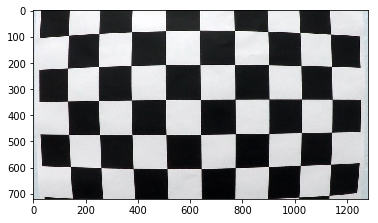

In [2]:
# prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

# Make a list of calibration images
fname = 'camera_cal/calibration1.jpg'
img = cv2.imread(fname)
plt.imshow(img)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)


# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [4]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
print(len(objpoints))
print(len(imgpoints))

0
0


In [5]:
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        print(fname)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        cv2.imshow('img', img)
#         cv2.imwrite(write_name, img)


camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration2.jpg
camera_cal/calibration20.jpg
camera_cal/calibration3.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg


In [6]:
import pickle
%matplotlib inline
fname = 'camera_cal/calibration{}.jpg'.format(2)

img = cv2.imread( fname)
img_size = (img.shape[1], img.shape[0])

In [7]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

In [8]:

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

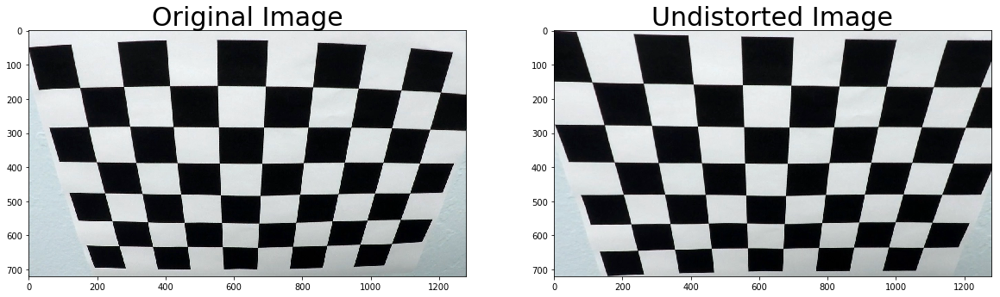

In [9]:
dst = cv2.undistort(img, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [84]:
images = glob.glob('test_images/*.jpg')
print(images)

['test_images/test1.jpg', 'test_images/test2.jpg', 'test_images/test3.jpg', 'test_images/test4.jpg', 'test_images/test5.jpg', 'test_images/test6.jpg']


In [11]:
def corners_unwarp(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M
    

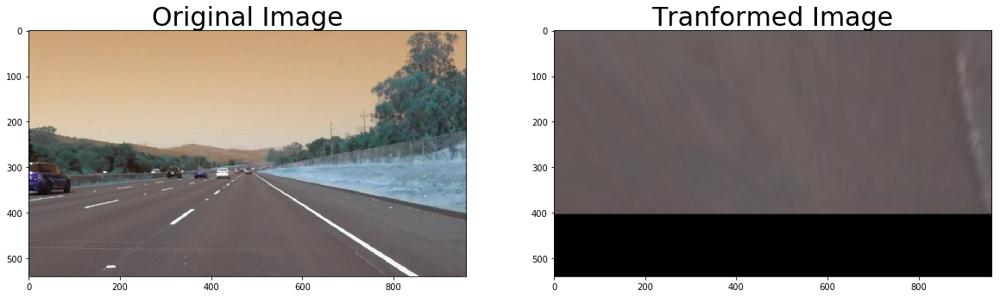

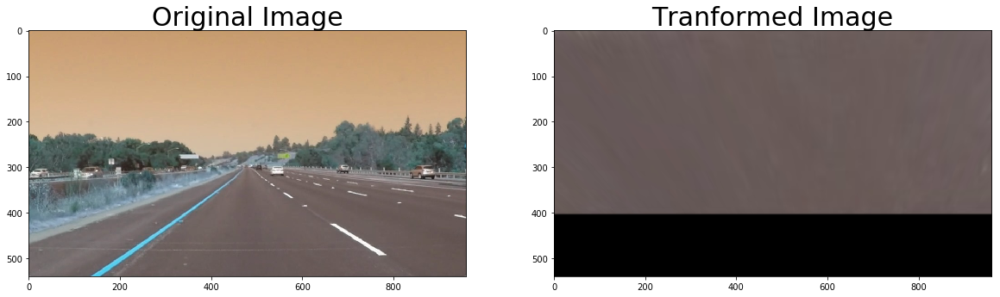

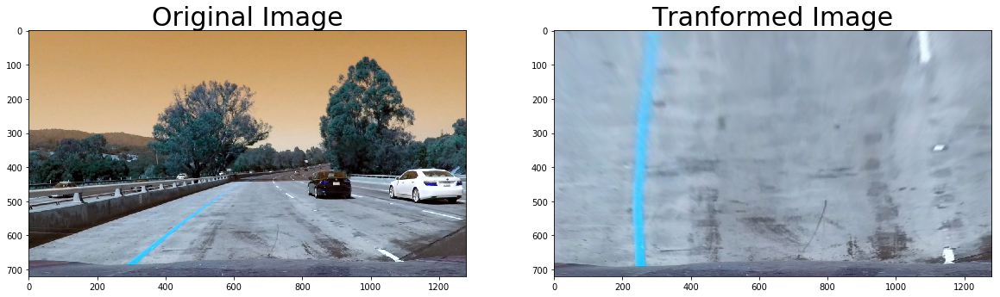

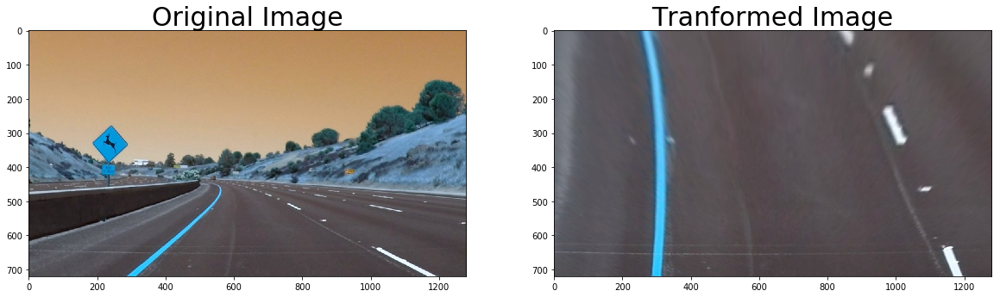

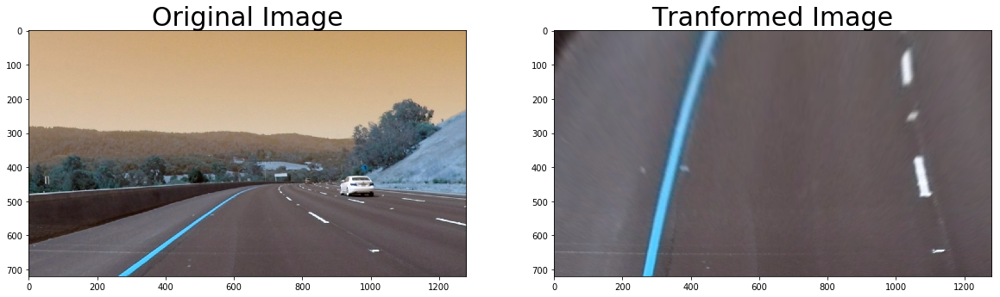

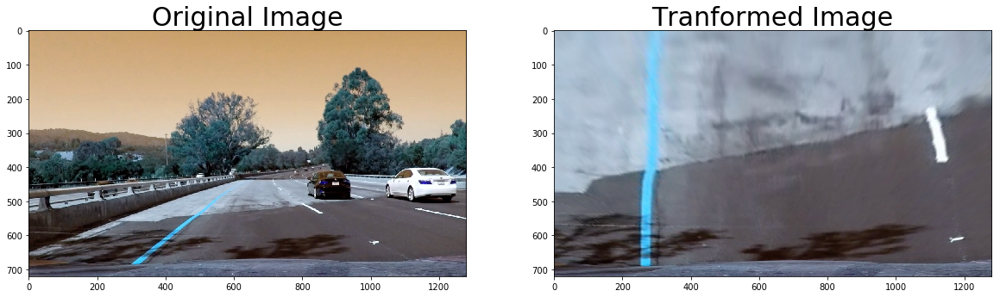

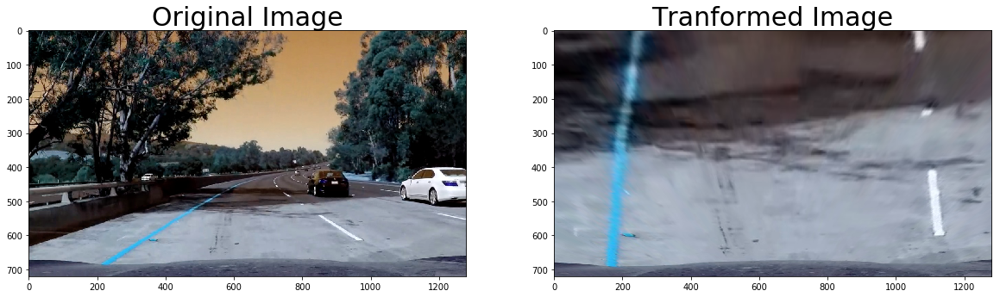

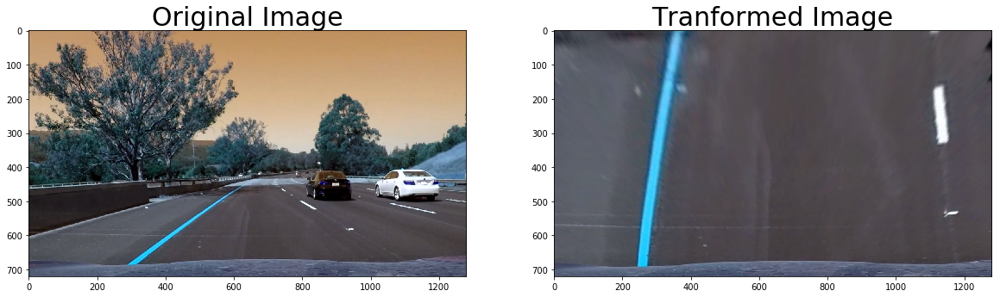

In [12]:
for image in images:
    img = cv2.imread(image)
    final = corners_unwarp(img, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(final[0])
    ax2.set_title('Tranformed Image', fontsize=30)

In [36]:
print(type(img))

<class 'numpy.ndarray'>


In [99]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):    
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x' :
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel).astype(float)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1.0
    # 6) Return this mask as your binary_output image

    return sxbinary

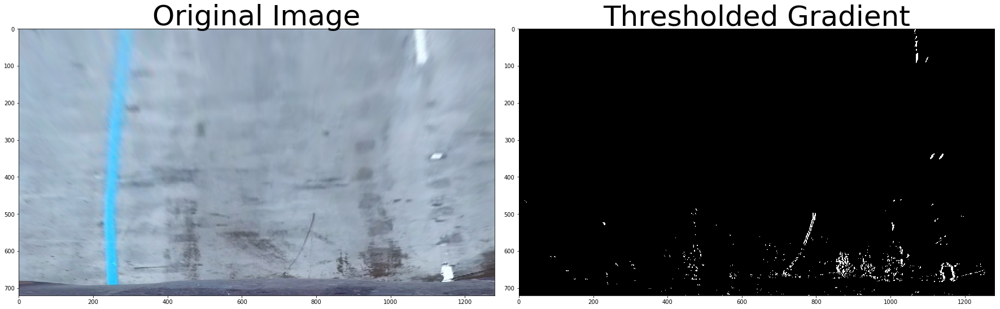

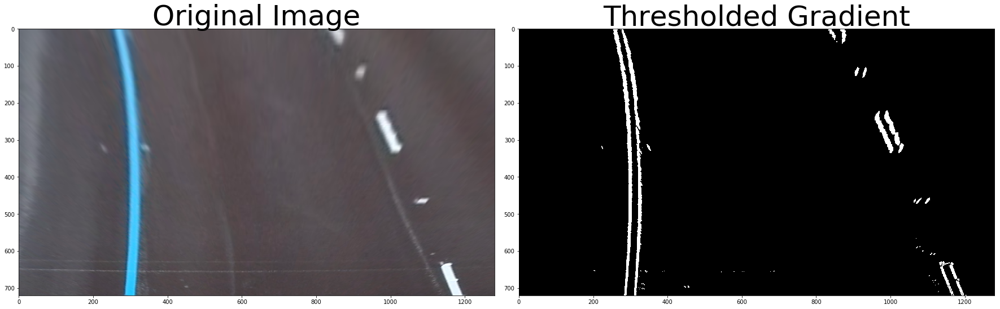

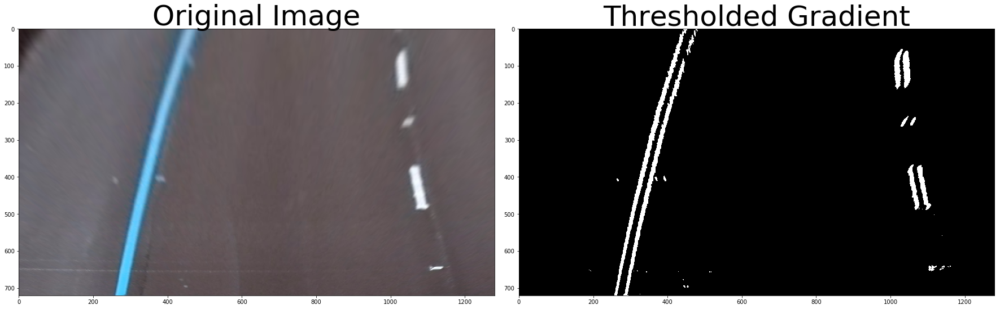

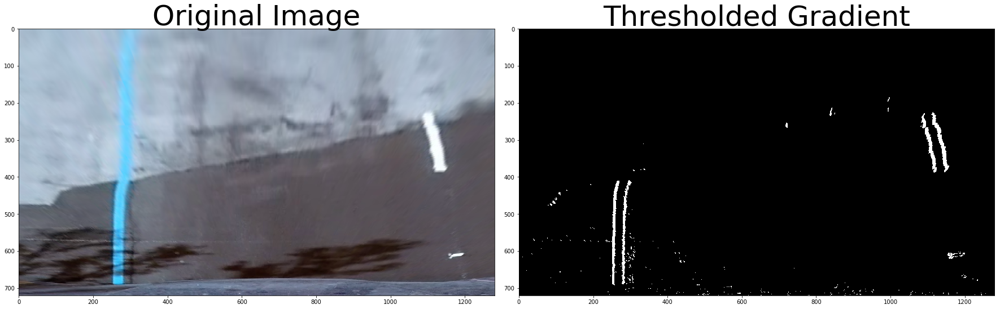

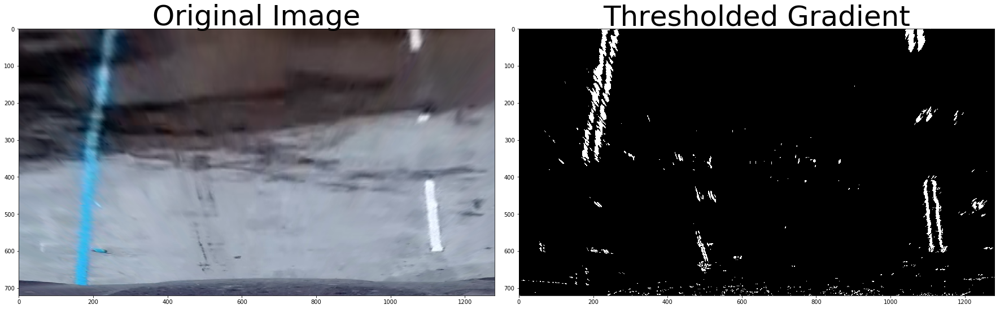

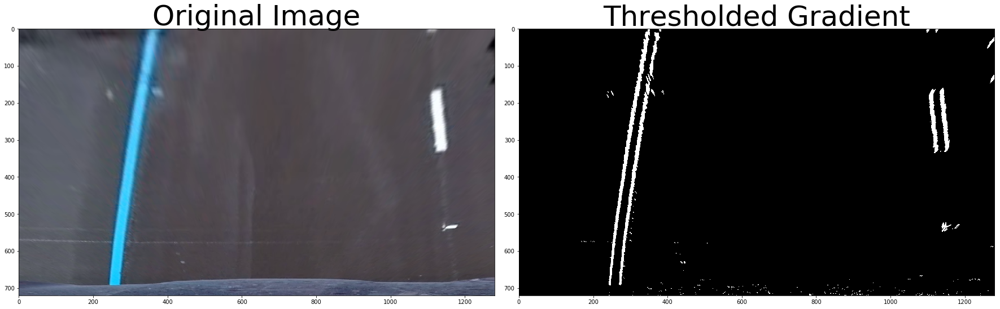

In [100]:
for image in images:
    img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    final,m = corners_unwarp(img, mtx, dist)

    # Run the function
    grad_binary = abs_sobel_thresh(final, orient='x', thresh_min=30, thresh_max=200)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(final)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(grad_binary, cmap='gray')
    ax2.set_title('Thresholded Gradient', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [93]:
img = cv2.imread(images[3])
final = corners_unwarp(img, mtx, dist)

In [194]:
def HLS(img, l_thresh_min=180, l_thresh_max=255):
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2] 

    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    return l_binary

def LUV(img, l_thresh_min=255, l_thresh_max=255):
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0] 

    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    return l_binary

def LAB(img, l_thresh_min=225, l_thresh_max=255):
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2] 

    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    return l_binary
    
    

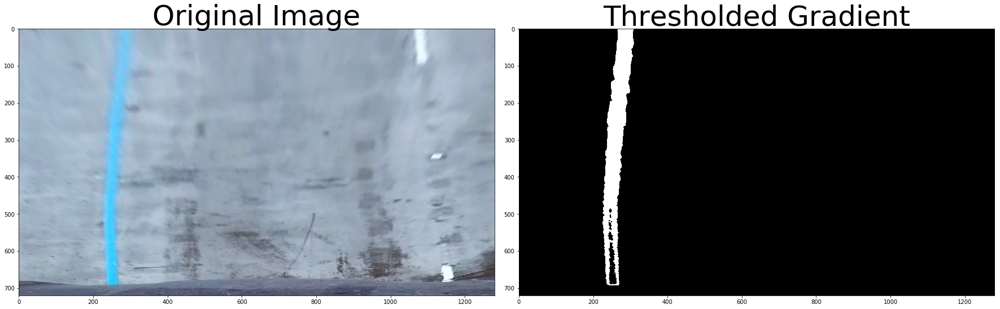

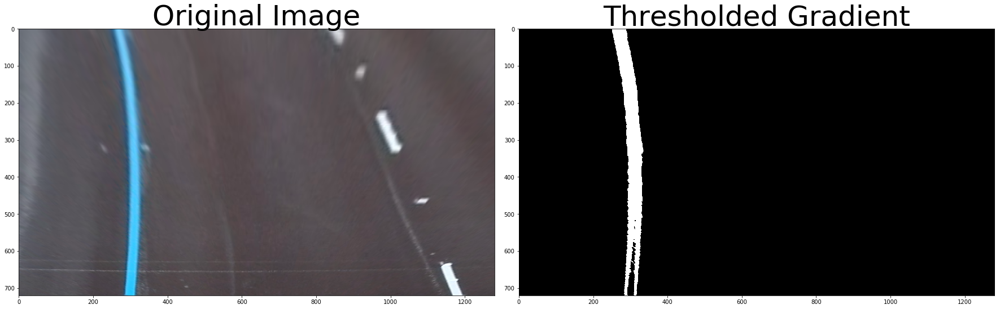

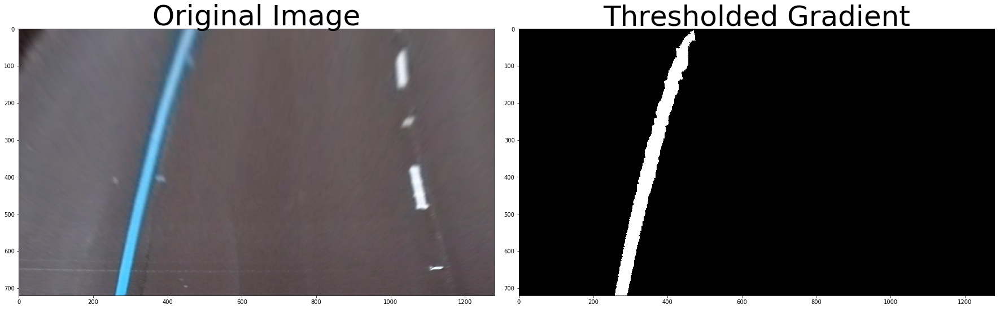

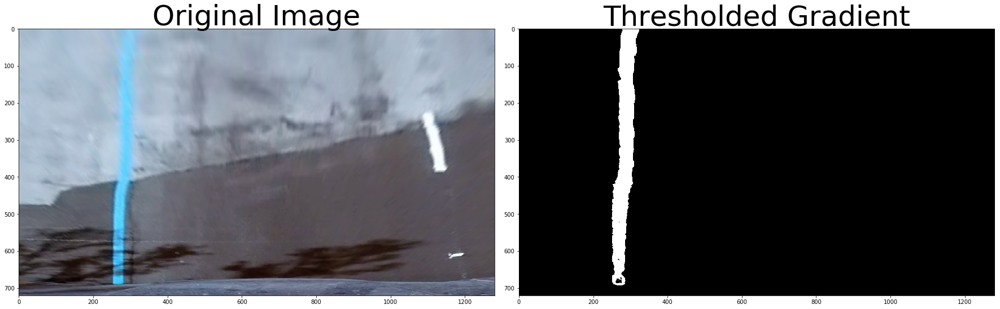

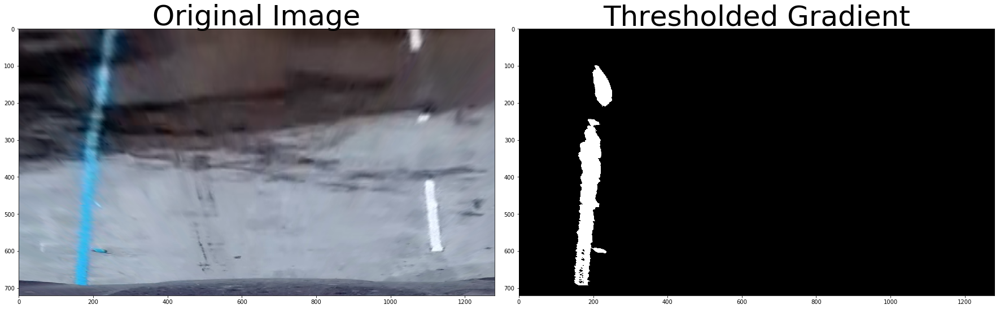

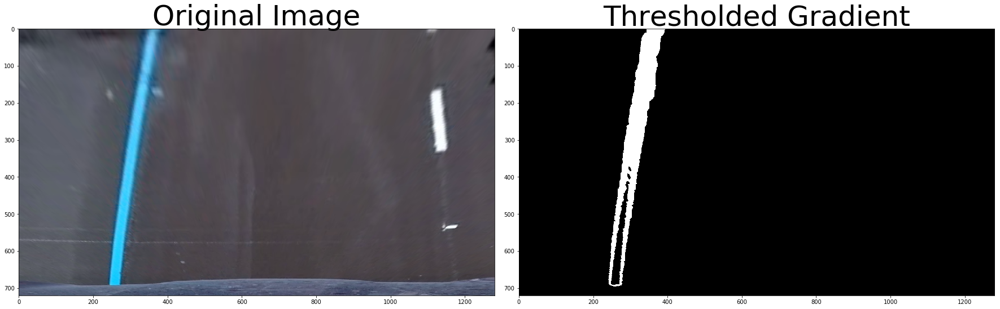

In [241]:
for image in images:
    img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    final,m = corners_unwarp(img, mtx, dist)
    binary = LAB(final,155,200)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(final)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Thresholded Gradient', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

In [113]:
def mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [110]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):    
    # Apply the following steps to img
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        dir_binary =  np.zeros_like(absgraddir)
        dir_binary[(absgraddir > thresh[0]) & (absgraddir < thresh[1])] = 1
    # Return the result
    return dir_binary



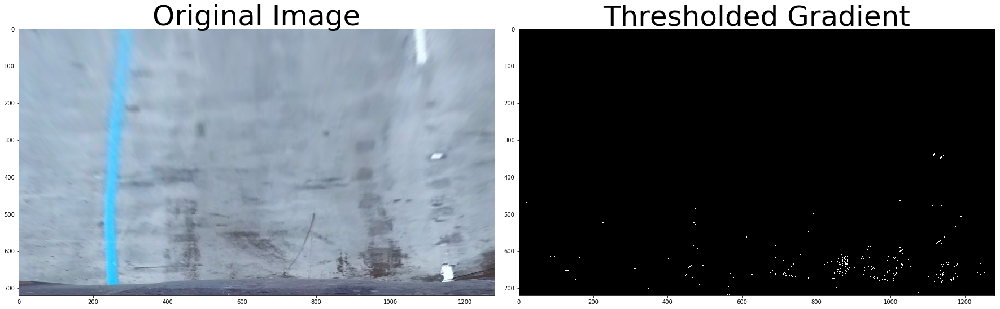

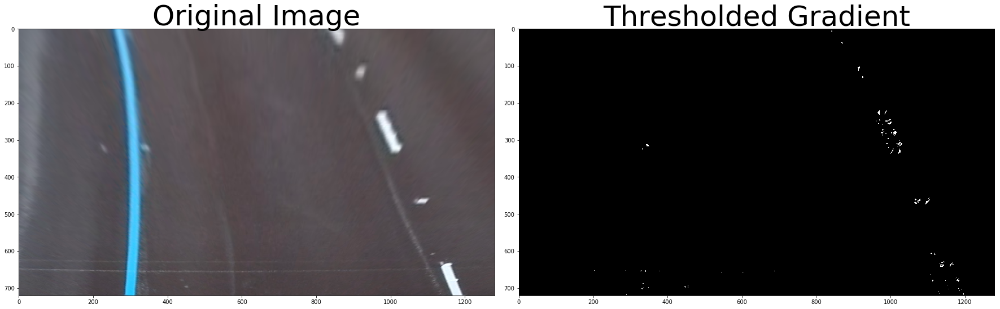

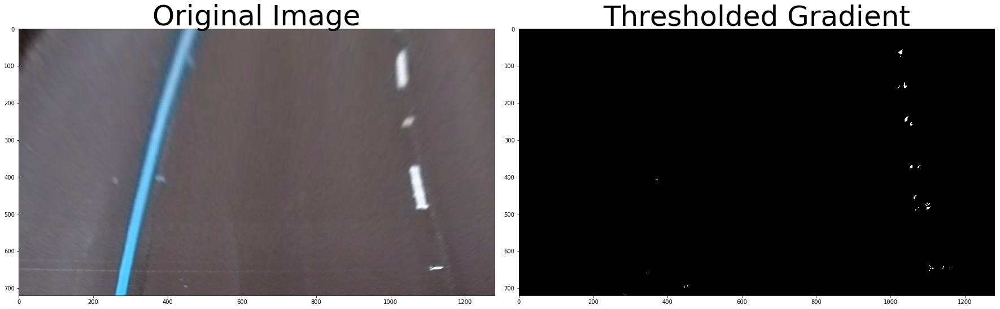

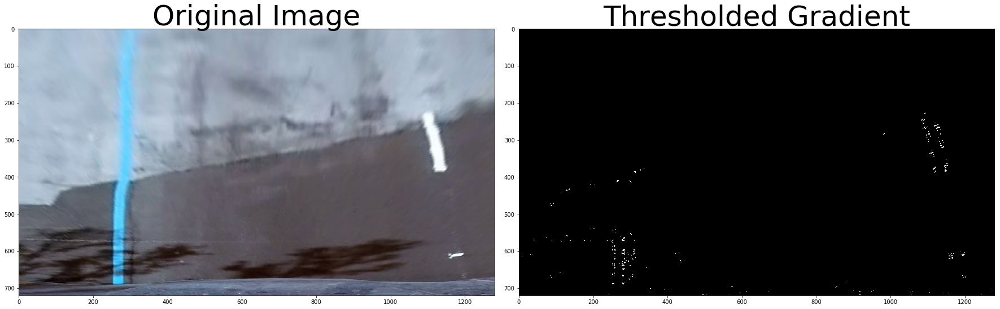

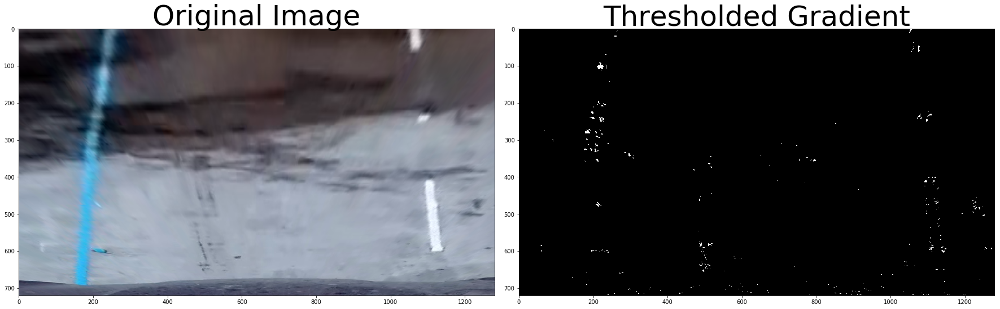

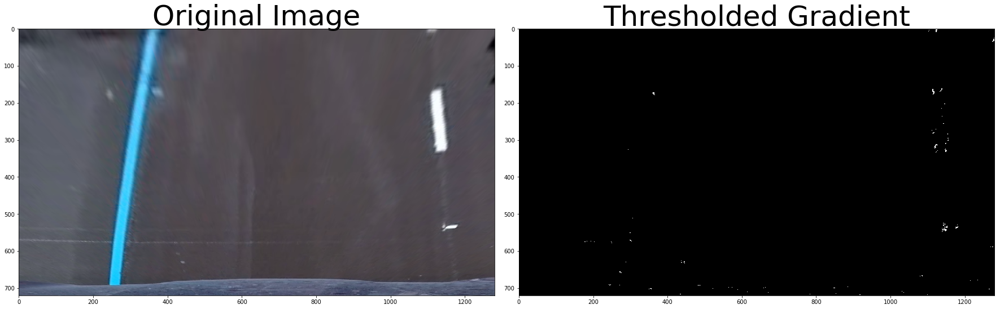

In [125]:
for image in images:
    img = cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    final,m = corners_unwarp(img, mtx, dist)
    binary = dir_threshold(final, sobel_kernel=5, thresh = (.65, 1.05))
    binary1 = mag_thresh(final, sobel_kernel=5, mag_thresh=(30, 255))
    combined = np.zeros_like(binary)
    combined[((binary == 1) & (binary1 == 1))] = 1
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(final)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Thresholded Gradient', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [249]:
def apply_thresholds(image,show=True):
    img = cv2.imread(image)
    final,m = corners_unwarp(img, mtx, dist)
    
    binary = HLS(final)
    grad_binary = abs_sobel_thresh(final, orient='x', thresh_min=30, thresh_max=200)
    binary1 = dir_threshold(final, sobel_kernel=5, thresh = (.65, 1.05))
    binary2 = mag_thresh(final, sobel_kernel=5, mag_thresh=(30, 255))
    binary3 = LUV(final,220,255)
    binary4 = LAB(final,155,200)
    
    combined = np.zeros_like(binary)
    combined[ ((binary == 1)|(binary4 == 1)|(binary3==1))] = 1
    
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(final)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('Thresholded Gradient', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    else:
        return combined
    

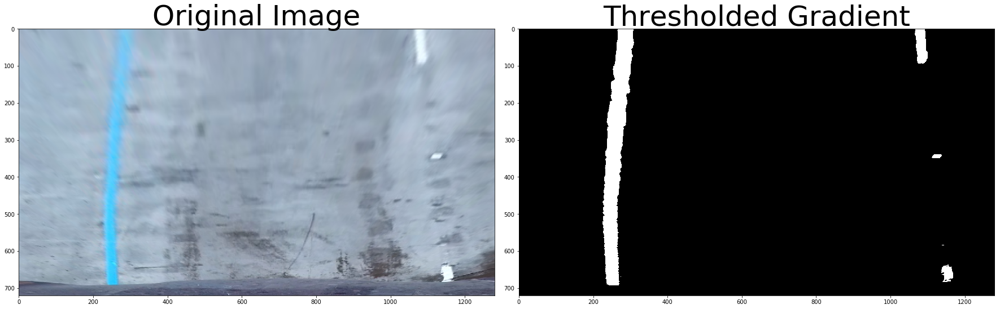

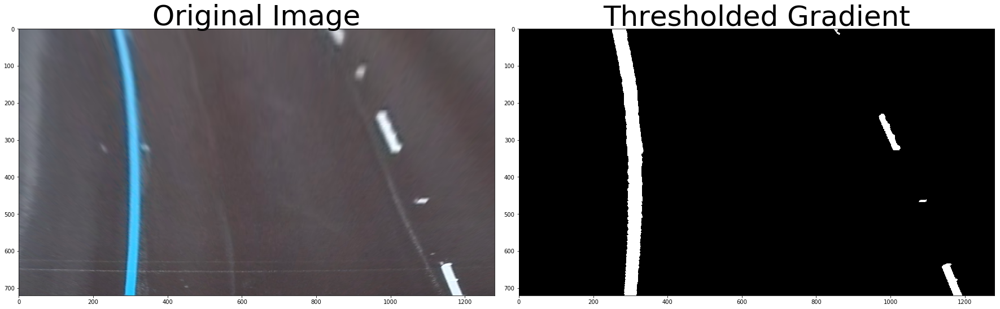

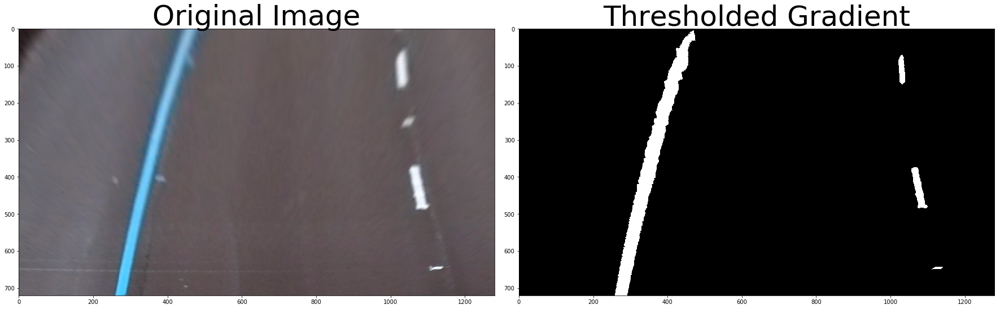

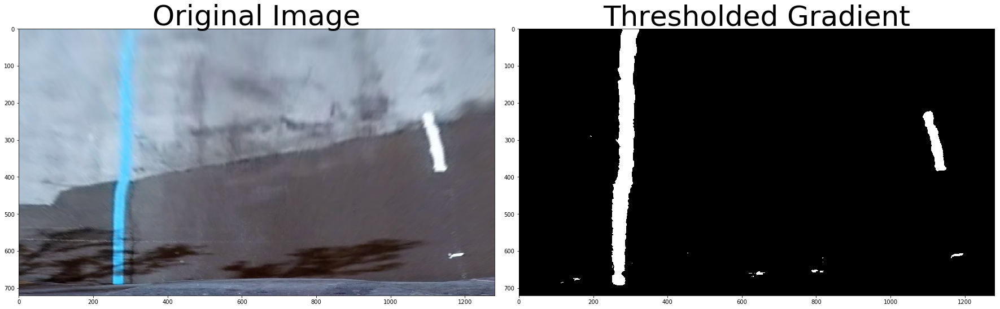

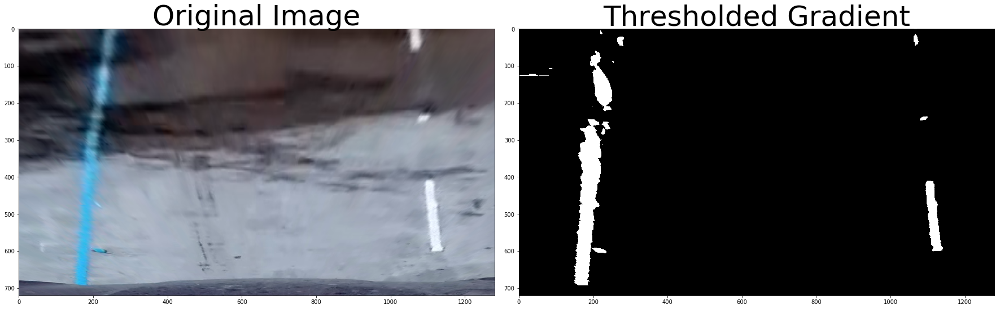

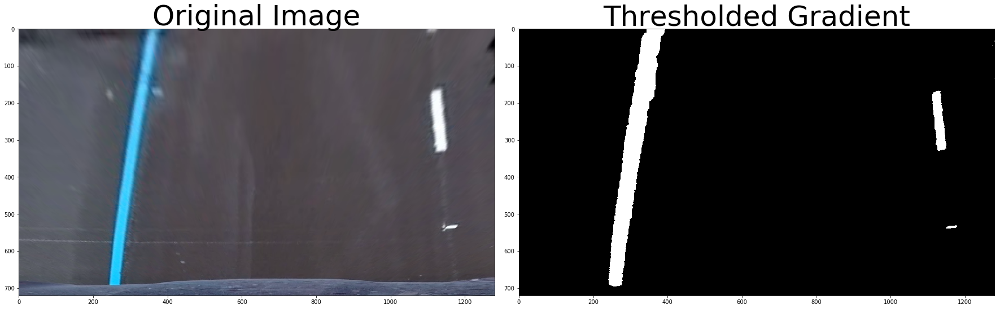

In [250]:
for image in images:
    apply_thresholds(image,show=True)

//anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


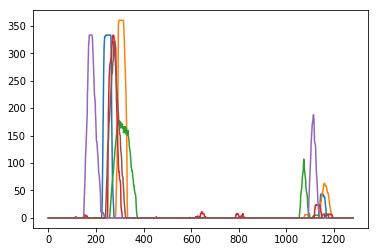

In [254]:
for image in images:
    test=apply_thresholds(image,show=False)
    histogram = np.sum(test[test.shape[0]/2:,:], axis=0)
    plt.plot(histogram)